In [5]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [8]:
pip install contractions

  Obtaining dependency information for contractions from https://files.pythonhosted.org/packages/bb/e4/725241b788963b460ce0118bfd5c505dd3d1bdd020ee740f9f39044ed4a7/contractions-0.1.73-py2.py3-none-any.whl.metadata
  Obtaining dependency information for textsearch>=0.0.21 from https://files.pythonhosted.org/packages/e2/0f/6f08dd89e9d71380a369b1f5b6c97a32d62fc9cfacc1c5b8329505b9e495/textsearch-0.0.24-py2.py3-none-any.whl.metadata
  Obtaining dependency information for anyascii from https://files.pythonhosted.org/packages/4f/7b/a9a747e0632271d855da379532b05a62c58e979813814a57fa3b3afeb3a4/anyascii-0.3.2-py3-none-any.whl.metadata
  Obtaining dependency information for pyahocorasick from https://files.pythonhosted.org/packages/f2/8b/e6baa0246d3126d509d56f55f8f8be7b9cd914d8f87d1277f25d9af55351/pyahocorasick-2.1.0-cp311-cp311-macosx_10_9_universal2.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 4.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6

In [2]:
pip install textblob

  Obtaining dependency information for textblob from https://files.pythonhosted.org/packages/02/07/5fd2945356dd839974d3a25de8a142dc37293c21315729a41e775b5f3569/textblob-0.18.0.post0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.3/626.3 kB 5.9 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [7]:
pip install numpy==1.24.0

  Obtaining dependency information for numpy==1.24.0 from https://files.pythonhosted.org/packages/6c/90/c4a8a771b87fd7d1c9d6648fd08927825d31d80d98201149df14c9787214/numpy-1.24.0-cp311-cp311-macosx_11_0_arm64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 14.3 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tables 3.8.0 requires blosc2~=2.0.0, which is not installed.
tables 3.8.0 requires cython>=0.29.21, which is not installed.
gensim 4.3.0 requires FuzzyTM>=0.4.0, which is not installed.
blis 1.0.1 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.24.0 which is incompatible.
thinc 8.3.2 requires numpy<2.1.0,>=2.0.0; python_version >= "3.9", but you have numpy 1.24.

In [33]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.7 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283839 sha256=6d14bd373cb5d8571cccf2b0c73c0ebc8d8ace260dbbd0d54e1469ddf3b5e989
  Stored in directory: /Users/payalchatterjee/Library/Caches/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime
Note: you may need to restart the kernel to use updated packages.


In [44]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import accuracy_score, classification_report

import re
import spacy
from nltk.corpus import stopwords

import seaborn as sns
import matplotlib.pyplot as plt

from scipy.sparse import vstack
from sklearn.svm import LinearSVC

import matplotlib.pyplot as plt
import seaborn as sns

from lime.lime_text import LimeTextExplainer

In [45]:
# Load datasets
train_data = pd.read_csv('/Users/payalchatterjee/EE599 HW/Final Project/Dataset/train.csv')
test_data = pd.read_csv('/Users/payalchatterjee/EE599 HW/Final Project/Dataset/test.csv')

# Exploratory Data Analysis

### 1. Class Distribution Plot
To check if there is a class imbalance between disaster and non-disaster tweets.

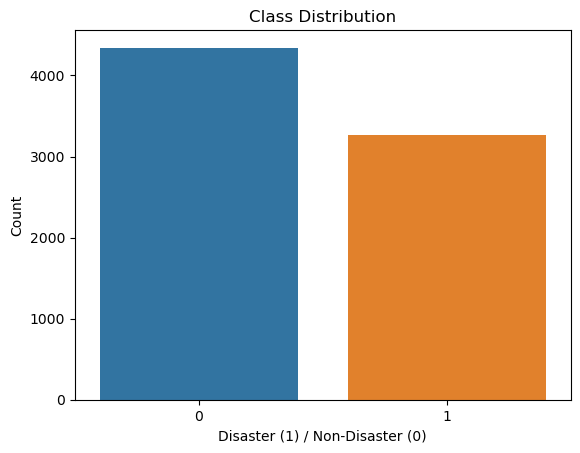

In [46]:
sns.countplot(x='target', data=train_data)
plt.title('Class Distribution')
plt.xlabel('Disaster (1) / Non-Disaster (0)')
plt.ylabel('Count')
plt.show()

### 2. Tweet Length Distribution
Compare the distribution of tweet lengths (number of characters or words) between disaster and non-disaster tweets.

/Users/payalchatterjee/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/payalchatterjee/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/payalchatterjee/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/payalchatterjee/anaconda3/lib/python3.11/sit

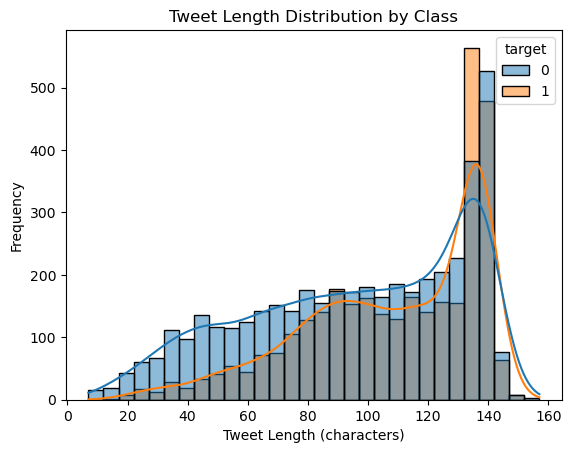

In [47]:
train_data['text_length'] = train_data['text'].apply(len)
sns.histplot(data=train_data, x='text_length', hue='target', bins=30, kde=True)
plt.title('Tweet Length Distribution by Class')
plt.xlabel('Tweet Length (characters)')
plt.ylabel('Frequency')
plt.show()

### 3. Top Keywords in Disaster vs. Non-Disaster Tweets
Purpose: Identify keywords that are more common in disaster or non-disaster tweets.
How: Filter keywords by class and plot the most frequent ones using bar plots or word clouds.

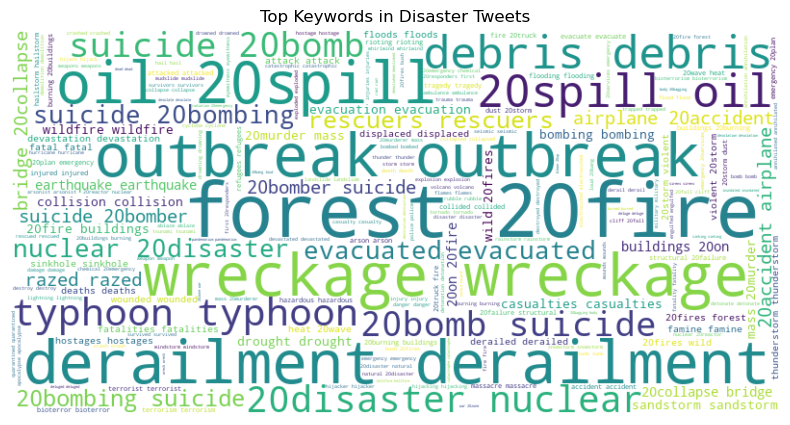

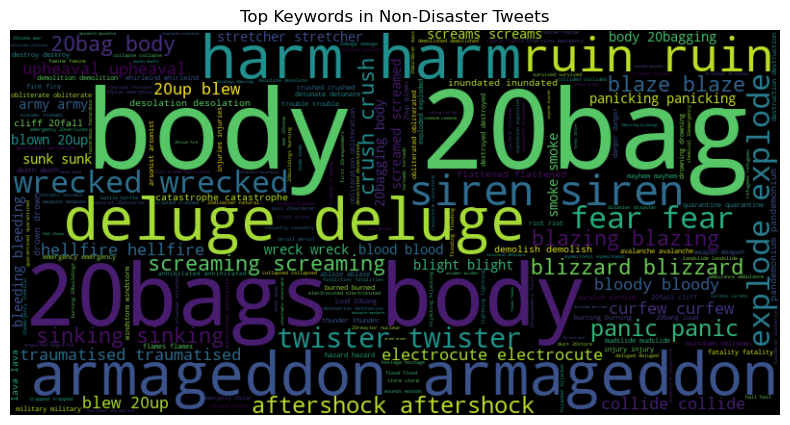

In [48]:
from wordcloud import WordCloud

disaster_keywords = ' '.join(train_data[train_data['target'] == 1]['keyword'].dropna())
non_disaster_keywords = ' '.join(train_data[train_data['target'] == 0]['keyword'].dropna())

# Plot for disaster tweets
plt.figure(figsize=(10, 5))
wordcloud_disaster = WordCloud(width=800, height=400, background_color='white').generate(disaster_keywords)
plt.imshow(wordcloud_disaster, interpolation='bilinear')
plt.axis("off")  # Hide axes
plt.title('Top Keywords in Disaster Tweets')
plt.show()

# Plot for non-disaster tweets
plt.figure(figsize=(10, 5))
wordcloud_nondisaster = WordCloud(width=800, height=400, background_color='black').generate(non_disaster_keywords)
plt.imshow(wordcloud_nondisaster, interpolation='bilinear')
plt.axis("off")  # Hide axes
plt.title('Top Keywords in Non-Disaster Tweets')
plt.show()

# Data Cleaning and Feature Engineering

In [49]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7613 entries, 0 to 7612
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           7613 non-null   int64 
 1   keyword      7552 non-null   object
 2   location     5080 non-null   object
 3   text         7613 non-null   object
 4   target       7613 non-null   int64 
 5   text_length  7613 non-null   int64 
dtypes: int64(3), object(3)
memory usage: 357.0+ KB


In [50]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3263 entries, 0 to 3262
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        3263 non-null   int64 
 1   keyword   3237 non-null   object
 2   location  2158 non-null   object
 3   text      3263 non-null   object
dtypes: int64(1), object(3)
memory usage: 102.1+ KB


In [51]:
# Display first few rows to understand the structure
print("Training Data Sample:")
print(train_data.head())
print("\nTest Data Sample:")
print(test_data.head())

Training Data Sample:
   id keyword location                                               text  \
0   1     NaN      NaN  Our Deeds are the Reason of this #earthquake M...   
1   4     NaN      NaN             Forest fire near La Ronge Sask. Canada   
2   5     NaN      NaN  All residents asked to 'shelter in place' are ...   
3   6     NaN      NaN  13,000 people receive #wildfires evacuation or...   
4   7     NaN      NaN  Just got sent this photo from Ruby #Alaska as ...   

   target  text_length  
0       1           69  
1       1           38  
2       1          133  
3       1           65  
4       1           88  

Test Data Sample:
   id keyword location                                               text
0   0     NaN      NaN                 Just happened a terrible car crash
1   2     NaN      NaN  Heard about #earthquake is different cities, s...
2   3     NaN      NaN  there is a forest fire at spot pond, geese are...
3   9     NaN      NaN           Apocalypse lighti

In [52]:
# Fill missing values in 'keyword' and 'location' columns (if they exist)
train_data['keyword'].fillna('', inplace=True)
train_data['location'].fillna('', inplace=True)
train_data['text'].fillna('', inplace=True)

# For test data, we do the same preprocessing
test_data['keyword'].fillna('', inplace=True)
test_data['location'].fillna('', inplace=True)
test_data['text'].fillna('', inplace=True)

# Combine 'keyword', 'location', and 'text' columns to form a single text input
train_data['combined_text'] = train_data['keyword'] + ' ' + train_data['location'] + ' ' + train_data['text']
test_data['combined_text'] = test_data['keyword'] + ' ' + test_data['location'] + ' ' + test_data['text']

/var/folders/gy/77w6543x5t5f_3mpt_qryrqr0000gn/T/ipykernel_10351/1164894608.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_data['keyword'].fillna('', inplace=True)
/var/folders/gy/77w6543x5t5f_3mpt_qryrqr0000gn/T/ipykernel_10351/1164894608.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always

In [53]:
print(train_data.head())

   id keyword location                                               text  \
0   1                   Our Deeds are the Reason of this #earthquake M...   
1   4                              Forest fire near La Ronge Sask. Canada   
2   5                   All residents asked to 'shelter in place' are ...   
3   6                   13,000 people receive #wildfires evacuation or...   
4   7                   Just got sent this photo from Ruby #Alaska as ...   

   target  text_length                                      combined_text  
0       1           69    Our Deeds are the Reason of this #earthquake...  
1       1           38             Forest fire near La Ronge Sask. Canada  
2       1          133    All residents asked to 'shelter in place' ar...  
3       1           65    13,000 people receive #wildfires evacuation ...  
4       1           88    Just got sent this photo from Ruby #Alaska a...  


In [54]:
# Load spaCy's English model for lemmatization
nlp = spacy.load("en_core_web_sm")

# Set up English stopwords using NLTK
stop_words = set(stopwords.words('english'))

# Define a custom cleaning function
def clean_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Remove URLs, mentions (@username), and hashtags (#hashtag)
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)  # Remove URLs
    text = re.sub(r'@\w+', '', text)  # Remove mentions
#     text = re.sub(r'#\w+', '', text)  # Remove hashtags
    
    # Remove non-alphabetic characters (punctuation, numbers, etc.)
    text = re.sub(r'[^a-z\s]', '', text)
    
    # Tokenization and Lemmatization
    doc = nlp(text)
    text = ' '.join([token.lemma_ for token in doc if token.text not in stop_words and token.is_alpha])
    
    # Remove extra spaces
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

# Apply the cleaning function to the 'combined_text' column
train_data['cleaned_text'] = train_data['combined_text'].apply(clean_text)
test_data['cleaned_text'] = test_data['combined_text'].apply(clean_text)

In [55]:
print(train_data.head())

   id keyword location                                               text  \
0   1                   Our Deeds are the Reason of this #earthquake M...   
1   4                              Forest fire near La Ronge Sask. Canada   
2   5                   All residents asked to 'shelter in place' are ...   
3   6                   13,000 people receive #wildfires evacuation or...   
4   7                   Just got sent this photo from Ruby #Alaska as ...   

   target  text_length                                      combined_text  \
0       1           69    Our Deeds are the Reason of this #earthquake...   
1       1           38             Forest fire near La Ronge Sask. Canada   
2       1          133    All residents asked to 'shelter in place' ar...   
3       1           65    13,000 people receive #wildfires evacuation ...   
4       1           88    Just got sent this photo from Ruby #Alaska a...   

                                        cleaned_text  
0        deed reaso

In [56]:
# Vectorize the combined text using TF-IDF
vectorizer = TfidfVectorizer(max_features=1000)
X_train = vectorizer.fit_transform(train_data['cleaned_text'])
X_test = vectorizer.transform(test_data['cleaned_text'])

# Set up target variable
y_train = train_data['target']

# Supervised Learning

## Logistics Regression: Model 1

In [57]:
# Initialize and train the model with regularization
model = LogisticRegression(max_iter=200, C=0.1, penalty='l2')  # You can try C=0.1, C=10, etc.
model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = model.predict(X_train)

# Calculate training accuracy
train_accuracy = accuracy_score(y_train, y_train_pred)

train_f1 = classification_report(y_train, y_train_pred, output_dict=True)['weighted avg']['f1-score']

# Print both accuracies
print("\nLogistic Regression Classifier:")
print(f"Training Accuracy: {train_accuracy}")
print(f"Training F1-Score: {train_f1}")

# Print classification report for the validation set
print("\nClassification Report (Training):\n", classification_report(y_train, y_train_pred))


Logistic Regression Classifier:
Training Accuracy: 0.7890450545120189
Training F1-Score: 0.7807514799116377

Classification Report (Training):
               precision    recall  f1-score   support

           0       0.76      0.93      0.83      4342
           1       0.87      0.60      0.71      3271

    accuracy                           0.79      7613
   macro avg       0.81      0.77      0.77      7613
weighted avg       0.80      0.79      0.78      7613



In [58]:
# Predict on the test set
test_predictions = model.predict(X_test)

# Save the predictions to a CSV file
output = pd.DataFrame({'id': test_data['id'], 'target': test_predictions})
output.to_csv('/Users/payalchatterjee/EE599 HW/Final Project/log_SL_test_predictions.csv', index=False)
print("Predictions saved to 'log_SL_test_predictions.csv'")

Predictions saved to 'log_SL_test_predictions.csv'


## Support Vector Machine classifier: Model 2

In [59]:
# Initialize classifiers
svm_model = SVC(kernel='linear', C=0.1)

# Train and evaluate SVM classifier
svm_model.fit(X_train, y_train)
y_train_pred_svm = svm_model.predict(X_train)

# Calculate training and validation accuracies and F1-scores for SVM
svm_train_accuracy = accuracy_score(y_train, y_train_pred_svm)
svm_train_f1 = classification_report(y_train, y_train_pred_svm, output_dict=True)['weighted avg']['f1-score']

# Print accuracies and F1-scores
print("\nSVM Classifier:")
print(f"Training Accuracy: {svm_train_accuracy}")
print(f"Training F1-Score: {svm_train_f1}")

# Full classification report for validation set
print("\nClassification Report for Training Set:")
print(classification_report(y_train, y_train_pred_svm))


SVM Classifier:
Training Accuracy: 0.7910153684487061
Training F1-Score: 0.7859636293750796

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.77      0.90      0.83      4342
           1       0.83      0.64      0.73      3271

    accuracy                           0.79      7613
   macro avg       0.80      0.77      0.78      7613
weighted avg       0.80      0.79      0.79      7613



In [60]:
# Predict on the test set
test_predictions = svm_model.predict(X_test)

# Save the predictions to a CSV file
output = pd.DataFrame({'id': test_data['id'], 'target': test_predictions})
output.to_csv('/Users/payalchatterjee/EE599 HW/Final Project/SVM_SL_test_predictions.csv', index=False)
print("Predictions saved to 'SVM_SL_test_predictions.csv'")

Predictions saved to 'SVM_SL_test_predictions.csv'


## Naive Bayes classifier: Model 3

In [61]:
# Initialize classifiers
nb_model = MultinomialNB(alpha=0.4)

# Train and evaluate Naive Bayes classifier
nb_model.fit(X_train, y_train)
y_train_pred_nb = nb_model.predict(X_train)

# Calculate training and validation accuracies and F1-scores for Naive Bayes
nb_train_accuracy = accuracy_score(y_train, y_train_pred_nb)
nb_train_f1 = classification_report(y_train, y_train_pred_nb, output_dict=True)['weighted avg']['f1-score']

# Cross-validation scores
from sklearn.model_selection import cross_val_score
scores = cross_val_score(nb_model, X_train, y_train, cv=5, scoring='accuracy')

# Display results
print("\nNaive Bayes Classifier:")
print(f"Training Accuracy: {nb_train_accuracy}")
print(f"Training F1-Score: {nb_train_f1}")

# Full classification report for validation set
print("\nClassification Report for Training Set:")
print(classification_report(y_train, y_train_pred_nb))


Naive Bayes Classifier:
Training Accuracy: 0.8050702745304085
Training F1-Score: 0.8025732800644192

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.80      0.88      0.84      4342
           1       0.82      0.70      0.76      3271

    accuracy                           0.81      7613
   macro avg       0.81      0.79      0.80      7613
weighted avg       0.81      0.81      0.80      7613



In [62]:
# Predict on the test set
test_predictions = nb_model.predict(X_test)

# Save the predictions to a CSV file
output = pd.DataFrame({'id': test_data['id'], 'target': test_predictions})
output.to_csv('/Users/payalchatterjee/EE599 HW/Final Project/NB_SL_test_predictions.csv', index=False)
print("Predictions saved to 'NB_SL_test_predictions.csv'")

Predictions saved to 'NB_SL_test_predictions.csv'


## Human Interpretability

### 1. LIME

In [63]:
# Create a LIME Text Explainer
explainer = LimeTextExplainer(class_names=['Non-Disaster', 'Disaster'])

# Function to predict probabilities using the Naive Bayes model
def predict_probabilities(texts):
    """Vectorize input text and return probability predictions."""
    return nb_model.predict_proba(vectorizer.transform(texts))

# Loop through the first `n_samples` in the test dataset
for idx in range(5, 20, 2):
    # Get the tweet text
    tweet_text = test_data['text'].iloc[idx]
    
    # Generate the explanation for the specific tweet
    exp = explainer.explain_instance(tweet_text, classifier_fn=predict_probabilities, num_features=10)
    
    # Display the explanation
    print(f"Explaining Tweet #{idx + 1}")
    exp.show_in_notebook(text=True)
    
    # Print the model's prediction
    predicted_class = model.predict(vectorizer.transform([tweet_text]))[0]
    print(f"Model Prediction for Tweet #{idx + 1}: {'Disaster' if predicted_class == 1 else 'Non-Disaster'}")
    print("-" * 80)  # Separator for clarity

Explaining Tweet #6


Model Prediction for Tweet #6: Disaster
--------------------------------------------------------------------------------
Explaining Tweet #8


Model Prediction for Tweet #8: Non-Disaster
--------------------------------------------------------------------------------
Explaining Tweet #10


Model Prediction for Tweet #10: Non-Disaster
--------------------------------------------------------------------------------
Explaining Tweet #12


Model Prediction for Tweet #12: Non-Disaster
--------------------------------------------------------------------------------
Explaining Tweet #14


Model Prediction for Tweet #14: Non-Disaster
--------------------------------------------------------------------------------
Explaining Tweet #16


Model Prediction for Tweet #16: Disaster
--------------------------------------------------------------------------------
Explaining Tweet #18


Model Prediction for Tweet #18: Non-Disaster
--------------------------------------------------------------------------------
Explaining Tweet #20


Model Prediction for Tweet #20: Non-Disaster
--------------------------------------------------------------------------------


### 2. Feature Importance Visualization

In [64]:
# Get the log probabilities of features given each class
log_probabilities = nb_model.feature_log_prob_

# Calculate the difference in log probabilities between the classes
# For binary classification, this is log P(feature|class1) - log P(feature|class0)
class_diff = log_probabilities[1] - log_probabilities[0]

# Get the feature names
feature_names = vectorizer.get_feature_names_out()

# Combine feature names with their importance scores
feature_importances = sorted(zip(class_diff, feature_names), key=lambda x: x[0], reverse=True)

# Display top positive and negative features
print("Top Positive Features (Disaster):")
for score, feature in feature_importances[:10]:
    print(f"{feature}: {score:.4f}")

print("\nTop Negative Features (Non-Disaster):")
for score, feature in feature_importances[-10:]:
    print(f"{feature}: {score:.4f}")

Top Positive Features (Disaster):
debris: 4.3640
derailment: 4.3289
legionnaire: 3.9251
migrant: 3.8311
bombing: 3.8100
hiroshima: 3.7600
severe: 3.7378
wreckage: 3.7077
investigator: 3.5912
mosque: 3.5802

Top Negative Features (Non-Disaster):
traumatise: -2.3245
cake: -2.3666
blight: -2.3762
blewup: -2.3854
ruin: -2.3875
ebay: -2.4984
write: -2.7035
bag: -2.7196
bodybag: -2.9553
aftershock: -3.1902


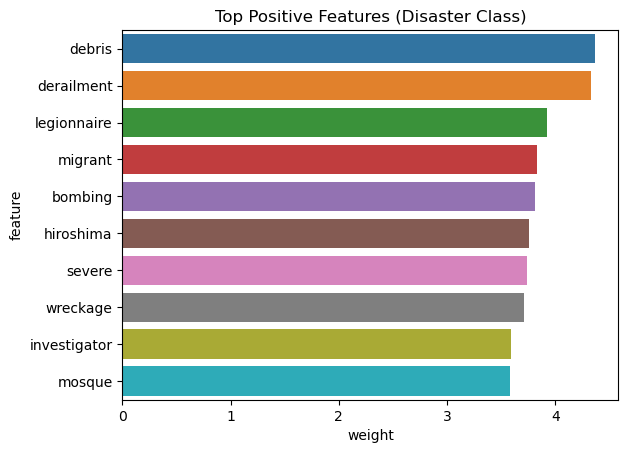

In [65]:
top_features = pd.DataFrame(feature_importances[:10], columns=["weight", "feature"])
sns.barplot(x="weight", y="feature", data=top_features)
plt.title("Top Positive Features (Disaster Class)")
plt.show()

### 3. Error Analysis

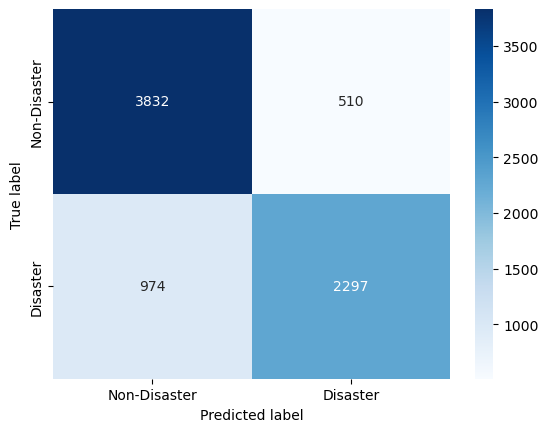

              precision    recall  f1-score   support

           0       0.80      0.88      0.84      4342
           1       0.82      0.70      0.76      3271

    accuracy                           0.81      7613
   macro avg       0.81      0.79      0.80      7613
weighted avg       0.81      0.81      0.80      7613

Examples of Misclassified Tweets:
Tweet: I accidentally killed an 87 day snap streak and now I wanna accidentally fall off a cliff ????????????????????
True Label: 1, Predicted: 0

Tweet: [Jax(MK2)] Stage Fatality:UUD+LK (Close)
True Label: 0, Predicted: 1

Tweet: Due to the rainstorm last night cupcake decorating is happening NOW at the Rec Hall! $2 - proceeds to #IWK! http://t.co/EaRONLwIFh
True Label: 0, Predicted: 1

Tweet: || So.... I just watched the trailed for The Dust Storm and I think part of me just died.... Colin is so perfect my goodness.
True Label: 0, Predicted: 1

Tweet: @cspanwj If 90BLKs&amp;8WHTs colluded 2 take WHT F @USAgov AUTH Hostage&amp;2 m

In [66]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate confusion matrix
cm = confusion_matrix(y_train, y_train_pred_nb)

# Visualize confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Non-Disaster', 'Disaster'], yticklabels=['Non-Disaster', 'Disaster'])
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

# Precision, Recall, F1 Score
from sklearn.metrics import classification_report
print(classification_report(y_train, y_train_pred_nb))

# Example of misclassified tweets
print("Examples of Misclassified Tweets:")
for index, row in misclassified.sample(5).iterrows():
    print(f"Tweet: {row['text']}")
    print(f"True Label: {row['target']}, Predicted: {y_train_pred_nb[index]}\n")

## Random Forest classifier: Model 4

In [67]:
# Initialize Random Forest classifier
rf_model = RandomForestClassifier(
    n_estimators=100,           # Fewer trees
    max_depth=30,               # Limit depth to control overfitting
    min_samples_leaf=5,         # Control minimum samples per leaf
    class_weight='balanced',    # Handle class imbalance
    random_state=42
)

# Train and evaluate Random Forest classifier
rf_model.fit(X_train, y_train)
y_train_pred_rf = rf_model.predict(X_train)

# Calculate training and validation accuracies and F1-scores for Random Forest
rf_train_accuracy = accuracy_score(y_train, y_train_pred_rf)
rf_train_f1 = classification_report(y_train, y_train_pred_rf, output_dict=True)['weighted avg']['f1-score']

# Print results
print("\nRandom Forest Classifier:")
print(f"Training Accuracy: {rf_train_accuracy}")
print(f"Training F1-Score: {rf_train_f1}")

# Full classification report for the validation set
print("\nClassification Report for Training Set:")
print(classification_report(y_train, y_train_pred_rf))


Random Forest Classifier:
Training Accuracy: 0.7676343097333509
Training F1-Score: 0.7586536538325788

Classification Report for Training Set:
              precision    recall  f1-score   support

           0       0.74      0.91      0.82      4342
           1       0.83      0.58      0.68      3271

    accuracy                           0.77      7613
   macro avg       0.79      0.74      0.75      7613
weighted avg       0.78      0.77      0.76      7613



In [68]:
# Predict on the test set
test_predictions = rf_model.predict(X_test)

# Save the predictions to a CSV file
output = pd.DataFrame({'id': test_data['id'], 'target': test_predictions})
output.to_csv('/Users/payalchatterjee/EE599 HW/Final Project/RF_SL_test_predictions.csv', index=False)
print("Predictions saved to 'RF_SL_test_predictions.csv'")

Predictions saved to 'RF_SL_test_predictions.csv'


/Users/payalchatterjee/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


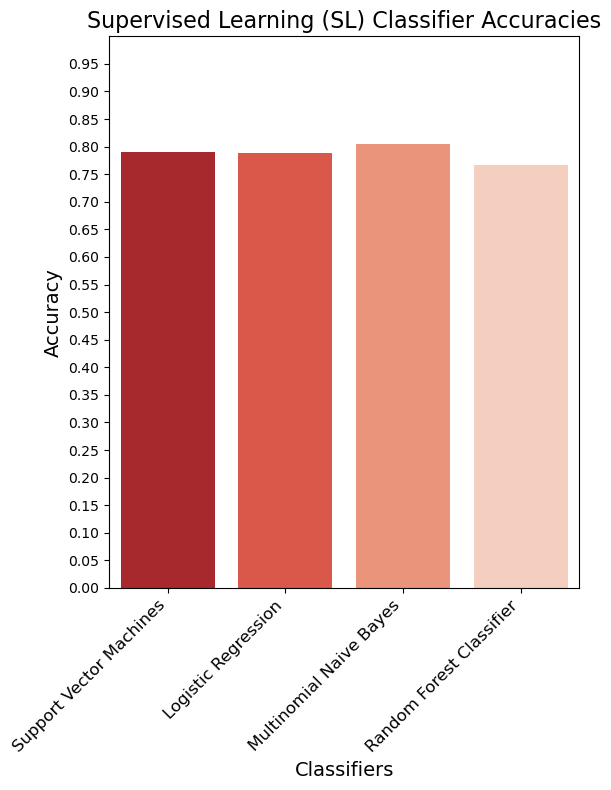

In [69]:
# Data for the plot
classifiers = [
    "Support Vector Machines",
    "Logistic Regression",
    "Multinomial Naive Bayes",
    "Random Forest Classifier"
]

accuracies = [
    svm_train_accuracy,         # Replace with your SVM accuracy
    train_accuracy,             # Replace with your Logistic Regression accuracy
    nb_train_accuracy,          # Replace with Naive Bayes accuracy
    rf_train_accuracy           # Replace with Random Forest accuracy
]

# Create the plot
plt.figure(figsize=(6, 8))
sns.barplot(x=classifiers, y=accuracies, palette="Reds_r")

# Customize the plot
plt.xlabel("Classifiers", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.title("Supervised Learning (SL) Classifier Accuracies", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.ylim(0, 1)  # Accuracy ranges from 0 to 1
plt.yticks(np.arange(0, 1.0, 0.05))
plt.tight_layout()

# Show the plot
plt.show()

## Human Interpretability: Error Analysis for all the models

In [70]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Function to evaluate and analyze a model
def evaluate_model(model, X_train, y_train, model_name, vectorizer=None):
    """
    Evaluate a given model, plot confusion matrix, print classification report,
    and show examples of misclassified tweets.

    Parameters:
    - model: Trained model object
    - X_train: Feature matrix for training data
    - y_train: True labels for training data
    - model_name: Name of the model for display purposes
    - vectorizer: Optional, vectorizer object if text needs transformation
    """
    print(f"Evaluating {model_name}...\n")

    # Predict on training data
    if vectorizer:
        y_train_pred = model.predict(vectorizer.transform(X_train['text']))
    else:
        y_train_pred = model.predict(X_train)
    
    # Generate confusion matrix
    cm = confusion_matrix(y_train, y_train_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Non-Disaster', 'Disaster'], yticklabels=['Non-Disaster', 'Disaster'])
    plt.title(f"{model_name} - Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

    # Print classification report
    print(f"{model_name} - Classification Report:")
    print(classification_report(y_train, y_train_pred))

    # Identify and display misclassified examples
    misclassified_indices = (y_train != y_train_pred).to_numpy().nonzero()[0]
    misclassified = X_train.iloc[misclassified_indices]
    print(f"Examples of Misclassified Tweets in {model_name}:")
    for index, row in misclassified.sample(min(5, len(misclassified))).iterrows():
        print(f"Tweet: {row['text']}")
        print(f"True Label: {y_train.iloc[index]}, Predicted: {y_train_pred[index]}\n")

Evaluating Logistic Regression...



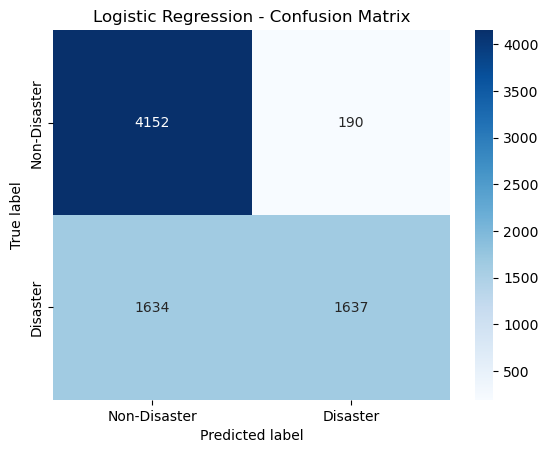

Logistic Regression - Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.96      0.82      4342
           1       0.90      0.50      0.64      3271

    accuracy                           0.76      7613
   macro avg       0.81      0.73      0.73      7613
weighted avg       0.79      0.76      0.74      7613

Examples of Misclassified Tweets in Logistic Regression:
Tweet: ? This Weekend: Stockholm Sweden - Aug 8 at Copperfields http://t.co/6un7xC9Sve
True Label: 1, Predicted: 0

Tweet: @UnivSFoundation For the people who died in Human Experiments by Unit 731 of Japanese military http://t.co/vVPLFQv58P http://t.co/Rwaph6dAUv
True Label: 1, Predicted: 0

Tweet: and I thought my surgical wounds were healed!!! this weather ain't helping either ):
True Label: 0, Predicted: 1

Tweet: Politics = Preschool Attitude: Russia orders to destroy all food coming from countries it doesn't like. - There is no hunger in the world?
True Label:

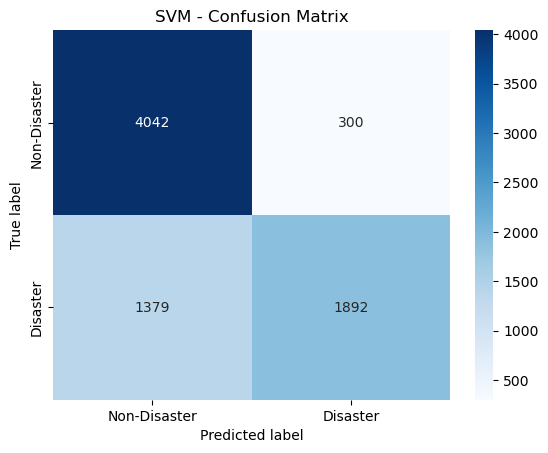

SVM - Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.93      0.83      4342
           1       0.86      0.58      0.69      3271

    accuracy                           0.78      7613
   macro avg       0.80      0.75      0.76      7613
weighted avg       0.80      0.78      0.77      7613

Examples of Misclassified Tweets in SVM:
Tweet: Longest Streak of Triple-Digit Heat Since 2013 Forecast in Dallas http://t.co/xc96rWUSZb http://t.co/XM9stfzcpV
True Label: 1, Predicted: 0

Tweet: annihilating quarterstaff of annihilation
True Label: 1, Predicted: 0

Tweet: @SirTitan45  Mega mood swing on a 24 hr schedule. Isn't that how structural failure occurs?
True Label: 0, Predicted: 1

Tweet: Path of Obliteration
Back From The Dead
Story by @KyleWappler @thisishavehope

 http://t.co/1PdNlsP8XW
True Label: 1, Predicted: 0

Tweet: FedEx no longer to transport bioterror germs in wake of anthrax lab mishaps http://t.co/qZQc8WWwcN via 

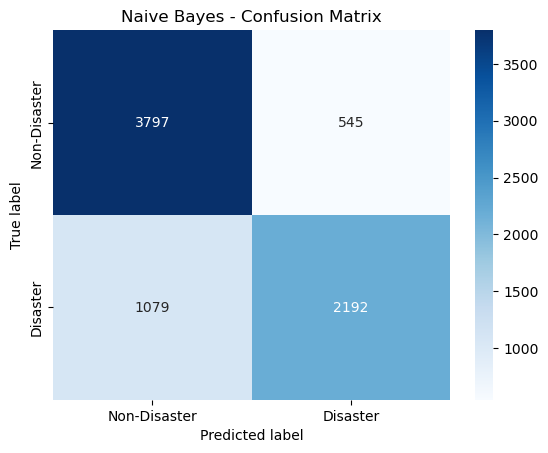

Naive Bayes - Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.87      0.82      4342
           1       0.80      0.67      0.73      3271

    accuracy                           0.79      7613
   macro avg       0.79      0.77      0.78      7613
weighted avg       0.79      0.79      0.78      7613

Examples of Misclassified Tweets in Naive Bayes:
Tweet: DFR EP016 Monthly Meltdown - On Dnbheaven 2015.08.06 http://t.co/EjKRf8N8A8 #Drum and Bass #heavy #nasty http://t.co/SPHWE6wFI5
True Label: 0, Predicted: 1

Tweet: Survived Spanish!! @ Sweet Ritual https://t.co/inIqzfyioi
True Label: 0, Predicted: 1

Tweet: #Newswatch: 2 vehicles collided at Lock and Lansdowne Sts in #Ptbo. Emerg crews on their way
True Label: 1, Predicted: 0

Tweet: 5 Rejected Mortal Kombat Fatalities: Mortal Kombat has stretched the boundaries of itsÛ_ http://t.co/igZ7v24GE9 http://t.co/M75DNf2xyg
True Label: 0, Predicted: 1

Tweet: #TheaterShooting DEFE

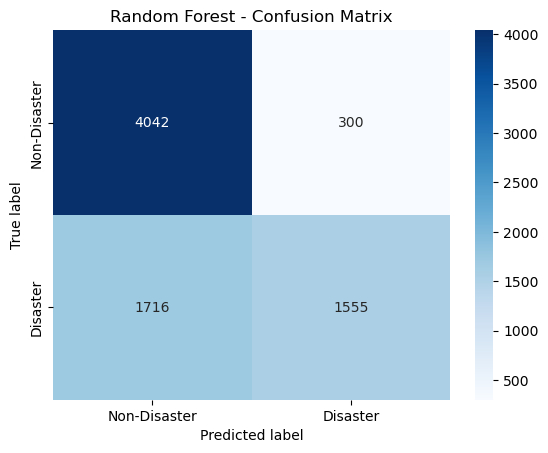

Random Forest - Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.93      0.80      4342
           1       0.84      0.48      0.61      3271

    accuracy                           0.74      7613
   macro avg       0.77      0.70      0.70      7613
weighted avg       0.76      0.74      0.72      7613

Examples of Misclassified Tweets in Random Forest:
Tweet: Vehicle Hijacking in  Vosloorus Gauteng on 2015-08-05 at 23:00 White Toyota Conquest  BKB066GP http://t.co/odmP01eyZU
True Label: 1, Predicted: 0

Tweet: Arnhem Weather - &lt;p&gt;An unrelenting and dangerous heat wave will expand across the South Central United StatesÛ_ http://t.co/yhAqa5WXoK
True Label: 1, Predicted: 0

Tweet: The Municipal Emergency Plan is now in effect. Stay safe everyone! #abstorm #yyc http://t.co/14CIcptKNa
True Label: 1, Predicted: 0

Tweet: Skinny Jeans are Hazardous for Your Health! #socialnews http://t.co/LTMa9xQXpx
True Label: 1, Predicted:

In [71]:
# List of models and their names
models = [
    (model, "Logistic Regression"),
    (svm_model, "SVM"),
    (nb_model, "Naive Bayes"),
    (rf_model, "Random Forest")
]

# Evaluate each model
for model, model_name in models:
    evaluate_model(model, train_data, y_train, model_name, vectorizer)


# Semi-Supervised Learning

## Logistics Regression: Model 1

In [72]:
# Step 1: Split your data into labeled and unlabeled
labeled_size = int(X_train.shape[0] * 0.7)  # 70% labeled, 30% unlabeled

# Labeled data (for training the initial model)
X_labeled = X_train[:labeled_size]
y_labeled = y_train[:labeled_size]

# Unlabeled data (for pseudo-labeling)
X_unlabeled = X_train[labeled_size:]

# Step 2: Train a Logistic Regression model on the labeled data
logistic_model = LogisticRegression(max_iter=100, C=0.0001, penalty='l2', random_state=42, class_weight='balanced')
logistic_model.fit(X_labeled, y_labeled)

# Step 3: Predict pseudo-labels for the unlabeled data
pseudo_labels = logistic_model.predict(X_unlabeled)

# Step 4: Combine labeled and pseudo-labeled data
X_combined = vstack([X_labeled, X_unlabeled])  # Combine labeled and pseudo-labeled data (sparse-friendly)
y_combined = np.concatenate([y_labeled, pseudo_labels])  # Combine labels and pseudo-labels

# Step 6: Retrain the Logistic Regression model on the combined dataset
logistic_model.fit(X_combined, y_combined)

# Step 7: Evaluate the model on the validation set
y_pred = logistic_model.predict(X_combined)

# Calculate validation accuracy and F1 score
train_accuracy = accuracy_score(y_combined, y_pred)
train_f1 = classification_report(y_combined, y_pred, output_dict=True)['weighted avg']['f1-score']

# Print the results
print("\nLogistic Regression Classifier (Semi-Supervised):")
print(f"Train Accuracy: {train_accuracy:.5f}")
print(f"Train F1-Score: {train_f1:.5f}")

print(classification_report(y_combined, y_pred))


Logistic Regression Classifier (Semi-Supervised):
Train Accuracy: 0.79903
Train F1-Score: 0.79907
              precision    recall  f1-score   support

           0       0.81      0.81      0.81      4094
           1       0.78      0.79      0.78      3519

    accuracy                           0.80      7613
   macro avg       0.80      0.80      0.80      7613
weighted avg       0.80      0.80      0.80      7613



In [73]:
# Predict on the test set
test_predictions = logistic_model.predict(X_test)

# Save the predictions to a CSV file
output = pd.DataFrame({'id': test_data['id'], 'target': test_predictions})
output.to_csv('/Users/payalchatterjee/EE599 HW/Final Project/test_predictions_log_ssl.csv', index=False)
print("Predictions saved to 'test_predictions_log_ssl.csv'")

Predictions saved to 'test_predictions_log_ssl.csv'


## Support Vector Machine (S3VM) classifier: Model 2

In [74]:
# Step 1: Split your data into labeled and unlabeled
# Let's assume that you have only a portion of the data labeled initially
labeled_size = int(X_train.shape[0] * 0.7)  # 10% labeled, 90% unlabeled

# Labeled data (for training the initial model)
labeled_data = train_data.iloc[:labeled_size]
X_labeled = vectorizer.transform(labeled_data['cleaned_text'])
y_labeled = labeled_data['target']

# Unlabeled data (for pseudo-labeling)
unlabeled_data = train_data.iloc[labeled_size:]
X_unlabeled = vectorizer.transform(unlabeled_data['cleaned_text'])

# Step 2: Train a model on the labeled data using LinearSVC
svm_model = LinearSVC(C=0.0001, max_iter=100, class_weight='balanced')  # Linear SVM for sparse data
svm_model.fit(X_labeled, y_labeled)

# Step 3: Predict pseudo-labels for the unlabeled data
pseudo_labels = svm_model.predict(X_unlabeled)

# Add the pseudo-labeled data to the training set
X_combined = vstack([X_labeled, X_unlabeled])  # Keep it sparse
y_combined = np.concatenate([y_labeled, pseudo_labels])

# Step 4: Split the combined labeled data into training and validation sets
# X_train, X_val, y_train, y_val = train_test_split(X_combined, y_combined, test_size=0.1, random_state=42)

# Step 5: Re-train the model using both labeled and pseudo-labeled data
svm_model.fit(X_combined, y_combined)

# Step 6: Evaluate the model on the training data
y_train_pred = svm_model.predict(X_combined)
svm_train_accuracy = accuracy_score(y_combined, y_train_pred)
svm_train_f1 = classification_report(y_combined, y_train_pred, output_dict=True)['weighted avg']['f1-score']
print(f"Accuracy of the SVM model on training data: {svm_train_accuracy:.5f}")
print(f"Train F1-Score: {svm_train_f1:.5f}")


# Optionally, print the classification report for validation data
print("Classification Report on Training Data:")
print(classification_report(y_combined, y_train_pred))

Accuracy of the SVM model on training data: 0.80363
Train F1-Score: 0.80404
Classification Report on Training Data:
              precision    recall  f1-score   support

           0       0.84      0.81      0.82      4275
           1       0.76      0.80      0.78      3338

    accuracy                           0.80      7613
   macro avg       0.80      0.80      0.80      7613
weighted avg       0.81      0.80      0.80      7613



In [75]:
# Predict on the test set
test_predictions = svm_model.predict(X_test)

# Save the predictions to a CSV file
output = pd.DataFrame({'id': test_data['id'], 'target': test_predictions})
output.to_csv('/Users/payalchatterjee/EE599 HW/Final Project/test_predictions_svm_ssl.csv', index=False)
print("Predictions saved to 'test_predictions_svm_ssl.csv'")

Predictions saved to 'test_predictions_svm_ssl.csv'


## Naive Bayes classifier: Model 3

In [76]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score, f1_score
from scipy.sparse import vstack

# Step 1: Split original training data into train and validation sets
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Define possible labeled-to-unlabeled ratios (e.g., 0.5:0.5, 0.6:0.4, etc.)
ratios = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]  # Labeled data ratios

# Store results for comparison
results = []

# Step 2: Iterate over each ratio
for ratio in ratios:
    # Split training data into labeled and unlabeled based on the ratio
    labeled_size = int(X_train_split.shape[0] * ratio)
    X_labeled = X_train_split[:labeled_size]
    y_labeled = y_train_split[:labeled_size]
    X_unlabeled = X_train_split[labeled_size:]

    # Train a Naive Bayes model on the labeled data
    naive_bayes_model = MultinomialNB(alpha=0.4)  # Adjust alpha if needed
    naive_bayes_model.fit(X_labeled, y_labeled)

    # Predict pseudo-labels for the unlabeled data
    pseudo_labels = naive_bayes_model.predict(X_unlabeled)

    # Combine labeled and pseudo-labeled data
    X_combined = vstack([X_labeled, X_unlabeled])
    y_combined = np.concatenate([y_labeled, pseudo_labels])

    # Retrain the model on the combined dataset
    naive_bayes_model.fit(X_combined, y_combined)

    # Evaluate the model on the training data
    y_train_pred = naive_bayes_model.predict(X_combined)
    train_accuracy = accuracy_score(y_combined, y_train_pred)
    train_f1 = f1_score(y_combined, y_train_pred, average='weighted')

    # Evaluate the model on the validation set
    y_val_pred = naive_bayes_model.predict(X_val)
    val_accuracy = accuracy_score(y_val, y_val_pred)
    val_f1 = f1_score(y_val, y_val_pred, average='weighted')

    # Save results
    results.append({
        "ratio": ratio,
        "train_accuracy": train_accuracy,
        "train_f1": train_f1,
        "val_accuracy": val_accuracy,
        "val_f1": val_f1
    })

    # Print intermediate results
    print(f"Ratio: {ratio:.2f}")
    print(f"Train Accuracy: {train_accuracy:.5f}, Train F1-Score: {train_f1:.5f}")
    print(f"Validation Accuracy: {val_accuracy:.5f}, Validation F1-Score: {val_f1:.5f}")
    print("=" * 50)

# Find the best ratio based on validation F1-score
best_result = max(results, key=lambda x: x["val_f1"])
print("\nBest Ratio and Performance:")
print(f"Labeled-to-Unlabeled Ratio: {best_result['ratio']:.2f}")
print(f"Best Train Accuracy: {best_result['train_accuracy']:.5f}")
print(f"Best Train F1-Score: {best_result['train_f1']:.5f}")
print(f"Best Validation Accuracy: {best_result['val_accuracy']:.5f}")
print(f"Best Validation F1-Score: {best_result['val_f1']:.5f}")

Ratio: 0.10
Train Accuracy: 0.93038, Train F1-Score: 0.92960
Validation Accuracy: 0.74524, Validation F1-Score: 0.74109
Ratio: 0.20
Train Accuracy: 0.92857, Train F1-Score: 0.92806
Validation Accuracy: 0.75246, Validation F1-Score: 0.74818
Ratio: 0.30
Train Accuracy: 0.91921, Train F1-Score: 0.91851
Validation Accuracy: 0.74655, Validation F1-Score: 0.74283
Ratio: 0.40
Train Accuracy: 0.90673, Train F1-Score: 0.90559
Validation Accuracy: 0.75509, Validation F1-Score: 0.75010
Ratio: 0.50
Train Accuracy: 0.89458, Train F1-Score: 0.89346
Validation Accuracy: 0.75312, Validation F1-Score: 0.74949
Ratio: 0.60
Train Accuracy: 0.87882, Train F1-Score: 0.87749
Validation Accuracy: 0.76756, Validation F1-Score: 0.76433
Ratio: 0.70
Train Accuracy: 0.86568, Train F1-Score: 0.86396
Validation Accuracy: 0.76691, Validation F1-Score: 0.76362
Ratio: 0.80
Train Accuracy: 0.84795, Train F1-Score: 0.84620
Validation Accuracy: 0.76691, Validation F1-Score: 0.76415
Ratio: 0.90
Train Accuracy: 0.82890, Tra

In [77]:
# Step 1: Split your data into labeled and unlabeled
labeled_size = int(X_train.shape[0] * 0.9)  # 90% labeled, 10% unlabeled

# Labeled data (for training the initial model)
X_labeled = X_train[:labeled_size]
y_labeled = y_train[:labeled_size]

# Unlabeled data (for pseudo-labeling)
X_unlabeled = X_train[labeled_size:]

# Step 2: Train a Naive Bayes model on the labeled data
naive_bayes_model = MultinomialNB(alpha=0.4)
naive_bayes_model.fit(X_labeled, y_labeled)

# Step 3: Predict pseudo-labels for the unlabeled data
pseudo_labels = naive_bayes_model.predict(X_unlabeled)

# Step 4: Combine labeled and pseudo-labeled data
X_combined = vstack([X_labeled, X_unlabeled])  # Combine labeled and pseudo-labeled data (sparse-friendly)
y_combined = np.concatenate([y_labeled, pseudo_labels])  # Combine labels and pseudo-labels

# Step 5: Retrain the Naive Bayes model on the combined dataset
naive_bayes_model.fit(X_combined, y_combined)

# Step 6: Evaluate the model on the combined dataset
y_combined_pred = naive_bayes_model.predict(X_combined)

# Calculate training accuracy and F1-score
nb_train_accuracy = accuracy_score(y_combined, y_combined_pred)
nb_train_f1 = classification_report(y_combined, y_combined_pred, output_dict=True)['weighted avg']['f1-score']

# Print the results
print("\nNaive Bayes Classifier (Semi-Supervised):")
print(f"Train Accuracy: {nb_train_accuracy:.5f}")
print(f"Train F1-Score: {nb_train_f1:.5f}")
print("Classification Report on Training Data:")
print(classification_report(y_combined, y_combined_pred))


Naive Bayes Classifier (Semi-Supervised):
Train Accuracy: 0.81387
Train F1-Score: 0.81187
Classification Report on Training Data:
              precision    recall  f1-score   support

           0       0.80      0.88      0.84      4292
           1       0.83      0.72      0.77      3321

    accuracy                           0.81      7613
   macro avg       0.82      0.80      0.81      7613
weighted avg       0.82      0.81      0.81      7613



In [78]:
# Predict on the test set
test_predictions = naive_bayes_model.predict(X_test)

# Save the predictions to a CSV file
output = pd.DataFrame({'id': test_data['id'], 'target': test_predictions})
output.to_csv('/Users/payalchatterjee/EE599 HW/Final Project/test_predictions_nb_ssl.csv', index=False)
print("Predictions saved to 'test_predictions_nb_ssl.csv'")

Predictions saved to 'test_predictions_nb_ssl.csv'


## Random Forest classifier: Model 4

In [79]:
from scipy.sparse import vstack
import scipy

# Step 1: Split your data into labeled and unlabeled
labeled_size = int(X_train.shape[0] * 0.7)  # 60% labeled, 40% unlabeled

# Labeled data (for training the initial model)
X_labeled = X_train[:labeled_size]
y_labeled = y_train[:labeled_size]

# Unlabeled data (for pseudo-labeling)
X_unlabeled = X_train[labeled_size:]

# Step 2: Train a Random Forest model on the labeled data
random_forest_model = RandomForestClassifier(
    n_estimators=100,        # Number of trees
    max_depth=10,            # Limit depth to prevent overfitting
    min_samples_split=10,    # Minimum samples to split
    min_samples_leaf=5,      # Minimum samples per leaf node
    max_features='sqrt',     # Use a subset of features for splits
    random_state=42,
    class_weight='balanced', # Handle imbalanced classes
    oob_score=True           # Enable Out-of-Bag error calculation
)
random_forest_model.fit(X_labeled, y_labeled)

# Step 3: Predict pseudo-labels for the unlabeled data
pseudo_probs = random_forest_model.predict_proba(X_unlabeled)

# Step 3a: Filter by confidence threshold (e.g., 0.9)
confidence_threshold = 0.9
confident_indices = np.max(pseudo_probs, axis=1) >= confidence_threshold

# Generate pseudo-labels from the RandomForest predictions
pseudo_labels = random_forest_model.predict(X_unlabeled)

# Step 3b: Filter pseudo-labeled data
X_unlabeled_confident = X_unlabeled[confident_indices]
pseudo_labels_confident = pseudo_labels[confident_indices]

# Step 4: Combine only confident pseudo-labeled data with labeled data
X_combined = vstack([X_labeled, X_unlabeled_confident]) if isinstance(X_labeled, (scipy.sparse.spmatrix)) else np.vstack([X_labeled, X_unlabeled_confident])
y_combined = np.concatenate([y_labeled, pseudo_labels_confident])  # Combine labels and confident pseudo-labels

# Step 5: Retrain the Random Forest model on the combined dataset
random_forest_model.fit(X_combined, y_combined)

# Step 6: Evaluate the model on the combined dataset
y_combined_pred = random_forest_model.predict(X_combined)

# Calculate training accuracy and F1-score
rf_train_accuracy = accuracy_score(y_combined, y_combined_pred)
rf_train_f1 = classification_report(y_combined, y_combined_pred, output_dict=True)['weighted avg']['f1-score']

# Print the results
print("\nRandom Forest Classifier (Confidence-Based Semi-Supervised):")
print(f"Train Accuracy: {rf_train_accuracy:.5f}")
print(f"Train F1-Score: {rf_train_f1:.5f}")
print("Classification Report on Training Data:")
print(classification_report(y_combined, y_combined_pred))


Random Forest Classifier (Confidence-Based Semi-Supervised):
Train Accuracy: 0.75755
Train F1-Score: 0.74915
Classification Report on Training Data:
              precision    recall  f1-score   support

           0       0.74      0.89      0.81      3067
           1       0.80      0.57      0.67      2262

    accuracy                           0.76      5329
   macro avg       0.77      0.73      0.74      5329
weighted avg       0.76      0.76      0.75      5329



In [80]:
# Predict on the test set
test_predictions = random_forest_model.predict(X_test)

# Save the predictions to a CSV file
output = pd.DataFrame({'id': test_data['id'], 'target': test_predictions})
output.to_csv('/Users/payalchatterjee/EE599 HW/Final Project/test_predictions_rf_ssl.csv', index=False)
print("Predictions saved to 'test_predictions_rf_ssl.csv'")

Predictions saved to 'test_predictions_rf_ssl.csv'


/Users/payalchatterjee/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


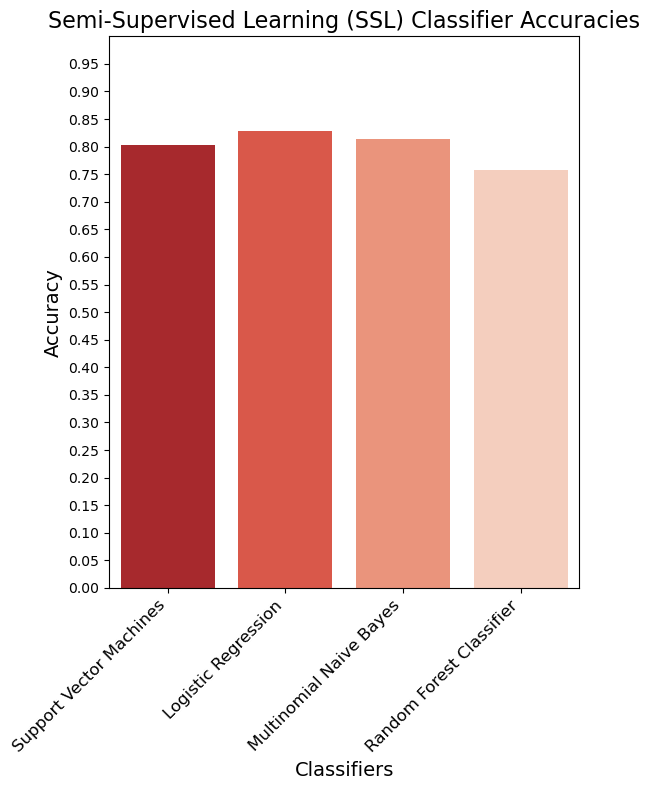

In [81]:
# Data for the plot
classifiers = [
    "Support Vector Machines",
    "Logistic Regression",
    "Multinomial Naive Bayes",
    "Random Forest Classifier"
]

accuracies = [
    svm_train_accuracy,         # Replace with your SVM accuracy
    train_accuracy,             # Replace with your Logistic Regression accuracy
    nb_train_accuracy,          # Replace with Naive Bayes accuracy
    rf_train_accuracy           # Replace with Random Forest accuracy
]

# Create the plot
plt.figure(figsize=(6, 8))
sns.barplot(x=classifiers, y=accuracies, palette="Reds_r")

# Customize the plot
plt.xlabel("Classifiers", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.title("Semi-Supervised Learning (SSL) Classifier Accuracies", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.ylim(0, 1)  # Accuracy ranges from 0 to 1
plt.yticks(np.arange(0, 1.0, 0.05))
plt.tight_layout()

# Show the plot
plt.show()

## Human Interpretability: Error Analysis for all the models

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Function to evaluate and analyze a model
def evaluate_model(model, X_train, y_train, model_name, vectorizer=None):
    """
    Evaluate a given model, plot confusion matrix, print classification report,
    and show examples of misclassified tweets.

    Parameters:
    - model: Trained model object
    - X_train: Feature matrix for training data
    - y_train: True labels for training data
    - model_name: Name of the model for display purposes
    - vectorizer: Optional, vectorizer object if text needs transformation
    """
    print(f"Evaluating {model_name}...\n")

    # Predict on training data
    if vectorizer:
        y_train_pred = model.predict(vectorizer.transform(X_train['text']))
    else:
        y_train_pred = model.predict(X_train)
    
    # Generate confusion matrix
    cm = confusion_matrix(y_train, y_train_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Non-Disaster', 'Disaster'], yticklabels=['Non-Disaster', 'Disaster'])
    plt.title(f"{model_name} - Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

    # Print classification report
    print(f"{model_name} - Classification Report:")
    print(classification_report(y_train, y_train_pred))

    # Identify and display misclassified examples
    misclassified_indices = (y_train != y_train_pred).to_numpy().nonzero()[0]
    misclassified = X_train.iloc[misclassified_indices]
    print(f"Examples of Misclassified Tweets in {model_name}:")
    for index, row in misclassified.sample(min(5, len(misclassified))).iterrows():
        print(f"Tweet: {row['text']}")
        print(f"True Label: {y_train.iloc[index]}, Predicted: {y_train_pred[index]}\n")

Evaluating Logistic Regression...



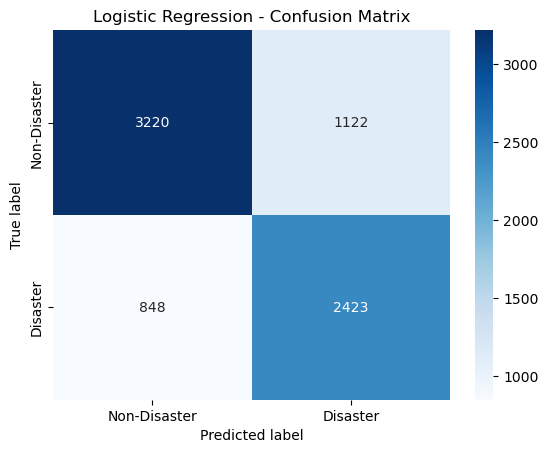

Logistic Regression - Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.74      0.77      4342
           1       0.68      0.74      0.71      3271

    accuracy                           0.74      7613
   macro avg       0.74      0.74      0.74      7613
weighted avg       0.75      0.74      0.74      7613

Examples of Misclassified Tweets in Logistic Regression:
Tweet: Children in Myanmar face a 'double catastrophe' as floods hit the most ... http://t.co/0jFNvAXFph
True Label: 1, Predicted: 0

Tweet: FedEx no longer will transport bioterror germs http://t.co/SHrhkfj1bC via @usatoday
True Label: 0, Predicted: 1

Tweet: @Louis_Tomlinson incredible? THE CHILDREN WERE SCREAMING BUILDINGS WERE BURNING AND I WAS DANCING IN THE ASHES
True Label: 1, Predicted: 0

Tweet: People are finally panicking about cable TV http://t.co/BBjLs1fsaD
True Label: 0, Predicted: 1

Tweet: I need a thunderstorm please!
True Label: 0, Predicted: 1

E

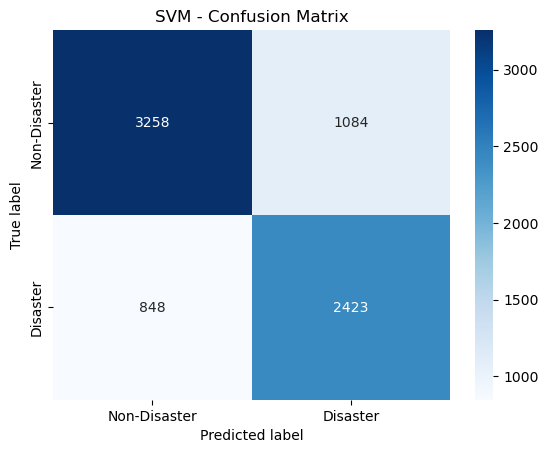

SVM - Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.75      0.77      4342
           1       0.69      0.74      0.71      3271

    accuracy                           0.75      7613
   macro avg       0.74      0.75      0.74      7613
weighted avg       0.75      0.75      0.75      7613

Examples of Misclassified Tweets in SVM:
Tweet: Marquei como visto Game of Thrones - 3x5 - Kissed by Fire http://t.co/CJHH17duli #bancodeseries
True Label: 0, Predicted: 1

Tweet: WANTED: gritty and real casualty photos of Pasta Thursdays at Amico's. Tag us or #amicospizzato #seeyouatamicos... http://t.co/MZ8VQXbKTs
True Label: 0, Predicted: 1

Tweet: Spokane authorities say they're struggling to solve arson cases like today's on Hamilton. http://t.co/Qbs2k01WzK http://t.co/mvLZIYsGLL
True Label: 1, Predicted: 0

Tweet: Trident 90225 Chevy fire Truck w/ Pumper  IMS Fire Dept. Red HO 1:87  plastic http://t.co/FAQNFUpeGn http://t.co/mQfOf

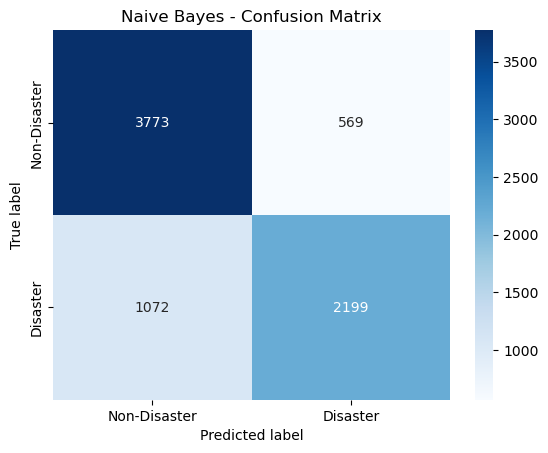

Naive Bayes - Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.87      0.82      4342
           1       0.79      0.67      0.73      3271

    accuracy                           0.78      7613
   macro avg       0.79      0.77      0.77      7613
weighted avg       0.79      0.78      0.78      7613

Examples of Misclassified Tweets in Naive Bayes:
Tweet: My hand is burning
True Label: 1, Predicted: 0

Tweet: Indeed!! I am fully aware of that battle! I support you in that fight!!  https://t.co/MctJnZX4H8
True Label: 1, Predicted: 0

Tweet: #psd #special Olap #world pres: http://t.co/9xO9mKQqsi How To Recognize A Hazardous Waste And The Multidimensi http://t.co/BP03eAFEWR
True Label: 1, Predicted: 0

Tweet: meek mill should join isis since he loves suicide-bombing his career for no good reason
True Label: 0, Predicted: 1

Tweet: @GrabakaHitman @Izi_Garcia when he flattened machida...did he lose that fight..nope he lost fights

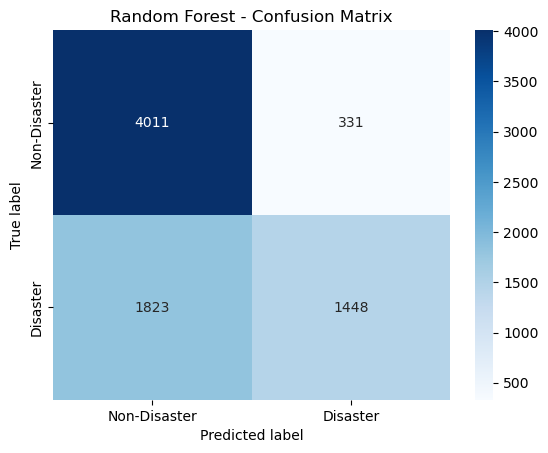

Random Forest - Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.92      0.79      4342
           1       0.81      0.44      0.57      3271

    accuracy                           0.72      7613
   macro avg       0.75      0.68      0.68      7613
weighted avg       0.74      0.72      0.70      7613

Examples of Misclassified Tweets in Random Forest:
Tweet: @drvox Trump can say nice things about nuclear power but 'drill baby drill!' + AGW denial = policy disaster for nuclear power.
True Label: 0, Predicted: 1

Tweet: My asshole is on fire  https://t.co/Y3FO0gHg8t
True Label: 0, Predicted: 1

Tweet: HURRICANE GUILLERMO LIVE NOAA TRACKING / LOOPING WED.AUG.5TH ~ http://t.co/RjopJKbydR ~  http://t.co/NUFDgw9YEv http://t.co/2oKSCwYoHC
True Label: 1, Predicted: 0

Tweet: @lovemywife1983 @FoxNews like shedid on 9/11 4the public facts I am not a journalist the Bush's washard on stopping more than just terrorist
True Label: 1, Pre

In [82]:
# List of models and their names
models = [
    (logistic_model, "Logistic Regression"),
    (svm_model, "SVM"),
    (naive_bayes_model, "Naive Bayes"),
    (random_forest_model, "Random Forest")
]

# Evaluate each model
for model, model_name in models:
    evaluate_model(model, train_data, y_train, model_name, vectorizer)
